<a href="https://colab.research.google.com/github/aedenj/continuous-improvement/blob/main/classes/eep-596-llms/project-three/Mini_Project3_Part2_AedenJameson.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Mini Project 3 - Part 2

Mini Project 3 - Part 2 will use Stability AI APIs to work on different image editing tasks - Including "Removing the photobomber" or "Removing artifacts from an image"


### `Deliverables`
Python Notebook: Submit a Python notebook (.ipynb) containing all the code used for the tasks. The notebook should be well-organized, with each task clearly identified and separated.

### `Note`:
Include comments in your code to explain what each section does. This will not only help the graders understand your code, but also help you understand your own code when you look back at it in the future.



# Stable Diffusion
Goal: In this assignment, you will experiment with the Stability AI API to generate and transform images.

In [1]:
%pip install stability-sdk

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 117.2/117.2 kB 4.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 5.6/5.6 MB 49.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.3/2.3 MB 57.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 319.7/319.7 kB 18.7 MB/s eta 0:00:00
  Attempting uninstall: protobuf
    Found existing installation: protobuf 4.25.6
    Uninstalling protobuf-4.25.6:
      Successfully uninstalled protobuf-4.25.6
  Attempting uninstall: grpcio
    Found existing installation: grpcio 1.71.0
    Uninstalling grpcio-1.71.0:
      Successfully uninstalled grpcio-1.71.0


In [2]:
import getpass, os

# Our host url should not be prepended with "https" nor should it have a trailing slash.
os.environ['STABILITY_HOST'] = 'grpc.stability.ai:443'

# Sign up for an account at the following link to get an API Key.
# https://platform.stability.ai/

# Click on the following link once you have created an account to be taken to your API Key.
# https://platform.stability.ai/account/keys

# Paste your API Key below after running this cell.

os.environ['STABILITY_KEY'] = getpass.getpass('Enter your API Key')

Enter your API Key··········


In [3]:
import io
import os
import warnings

from IPython.display import display
from PIL import Image
from stability_sdk import client
import stability_sdk.interfaces.gooseai.generation.generation_pb2 as generation


# Set up our connection to the API.
stability_api = client.StabilityInference(
    key=os.environ['STABILITY_KEY'], # API Key reference.
    verbose=True, # Print debug messages.
    engine="stable-diffusion-xl-1024-v1-0", # Set the engine to use for generation.
    # Check out the following link for a list of available engines: https://platform.stability.ai/docs/features/api-parameters#engine
)

INFO:stability_sdk.client:Opening channel to grpc.stability.ai:443
INFO:stability_sdk.client:Channel opened to grpc.stability.ai:443


## Task 1: Generate an Image
Generate an image using the Stability API. You will need to set up the generation parameters. The image could be anything of your choice, but make sure it adheres to the content policies. Display the generated image in the notebook.

INFO:stability_sdk.client:Sending request.
INFO:stability_sdk.client:Got answer 6df547cb-7596-48c7-8f03-d368f6e41b66 with artifact types ['ARTIFACT_IMAGE', 'ARTIFACT_CLASSIFICATIONS'] in 5.48s


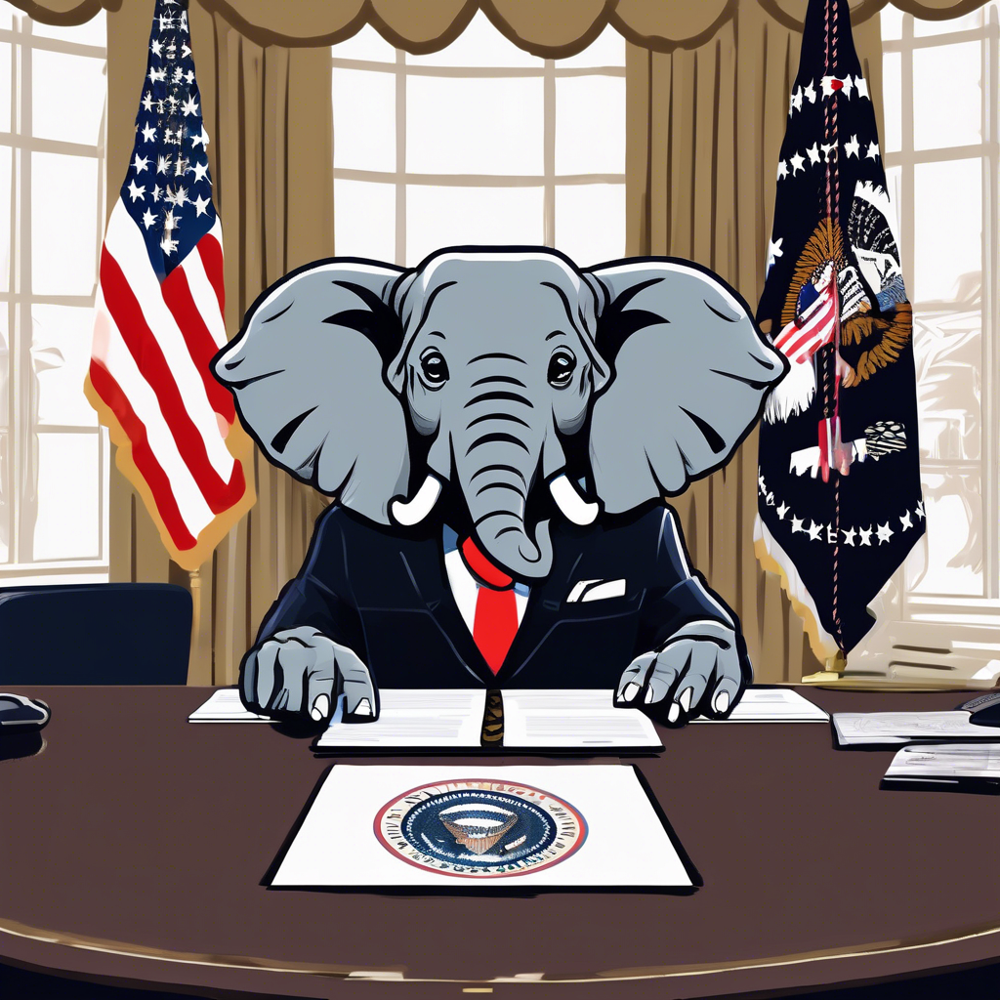

In [6]:
answers = stability_api.generate(
    prompt="""
    Generate me an image of an elephant dressed in urban streetwear sitting in the US Oval Office at the President's desk with the following qualities:

    * Realistic Style
    * HeadOn Shot
    * Fun and Poppy urban style
    """.strip(),
    seed=121245125, # If a seed is provided, the resulting generated image will be deterministic.
                    # What this means is that as long as all generation parameters remain the same, you can always recall the same image simply by generating it again.
                    # Note: This isn't quite the case for CLIP Guided generations, which we tackle in the CLIP Guidance documentation.
    steps=50, # Amount of inference steps performed on image generation. Defaults to 30.
    cfg_scale=8.0, # Influences how strongly your generation is guided to match your prompt.
                   # Setting this value higher increases the strength in which it tries to match your prompt.
                   # Defaults to 7.0 if not specified.
    width=1024, # Generation width, defaults to 512 if not included.
    height=1024, # Generation height, defaults to 512 if not included.
    sampler=generation.SAMPLER_K_DPMPP_2M # Choose which sampler we want to denoise our generation with.
                                                 # Defaults to k_dpmpp_2m if not specified. Clip Guidance only supports ancestral samplers.
                                                 # (Available Samplers: ddim, plms, k_euler, k_euler_ancestral, k_heun, k_dpm_2, k_dpm_2_ancestral, k_dpmpp_2s_ancestral, k_lms, k_dpmpp_2m, k_dpmpp_sde)
)

# Set up our warning to print to the console if the adult content classifier is tripped.
# If adult content classifier is not tripped, display generated image.
for resp in answers:
    for artifact in resp.artifacts:
        if artifact.finish_reason == generation.FILTER:
            warnings.warn(
                "Your request activated the API's safety filters and could not be processed."
                "Please modify the prompt and try again.")
        if artifact.type == generation.ARTIFACT_IMAGE:
            img = Image.open(io.BytesIO(artifact.binary))
            display(img)

## Task 2: Transform an Image
Transform the previously generated image using the Stability API. You could change the style, color, or any other aspect of the image. Set up the transformation parameters accordingly and display the transformed image.

INFO:stability_sdk.client:Sending request.
INFO:stability_sdk.client:Got answer d836867f-3826-4583-ae29-e9ae19c12484 with artifact types ['ARTIFACT_IMAGE', 'ARTIFACT_CLASSIFICATIONS'] in 5.38s


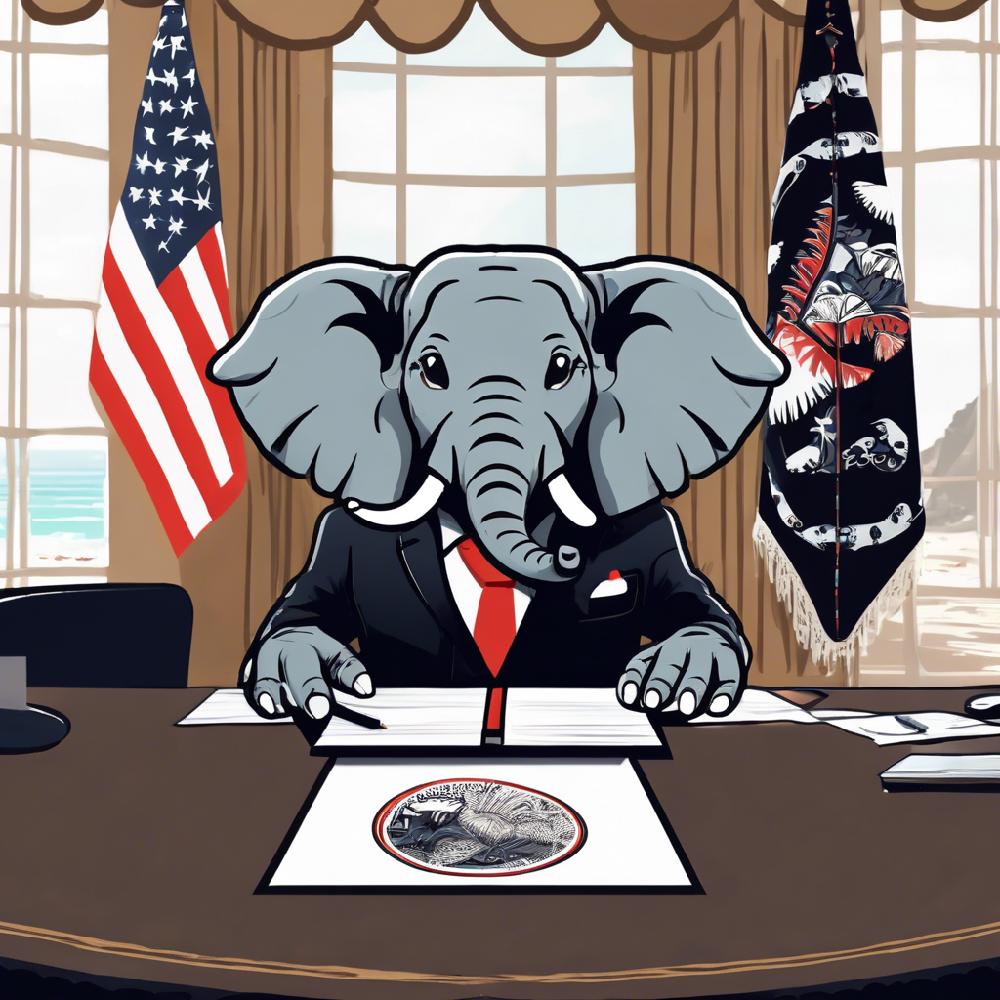

In [8]:
answers = stability_api.generate(
    prompt="Completely take the elephant out of the office and place the elephant in the image on the beach",
    init_image=img, # Assign our previously generated img as our Initial Image for transformation.
    start_schedule=0.6, # Set the strength of our prompt in relation to our initial image.
    seed=123463446, # If attempting to transform an image that was previously generated with our API,
                    # initial images benefit from having their own distinct seed rather than using the seed of the original image generation.
    steps=50, # Amount of inference steps performed on image generation. Defaults to 30.
    cfg_scale=8.0, # Influences how strongly your generation is guided to match your prompt.
                   # Setting this value higher increases the strength in which it tries to match your prompt.
                   # Defaults to 7.0 if not specified.
    width=1024, # Generation width, defaults to 512 if not included.
    height=1024, # Generation height, defaults to 512 if not included.
    sampler=generation.SAMPLER_K_DPMPP_2M # Choose which sampler we want to denoise our generation with.
                                                 # Defaults to k_dpmpp_2m if not specified. Clip Guidance only supports ancestral samplers.
                                                 # (Available Samplers: ddim, plms, k_euler, k_euler_ancestral, k_heun, k_dpm_2, k_dpm_2_ancestral, k_dpmpp_2s_ancestral, k_lms, k_dpmpp_2m, k_dpmpp_sde)
)

# Set up our warning to print to the console if the adult content classifier is tripped.
# If adult content classifier is not tripped, display generated image.
for resp in answers:
    for artifact in resp.artifacts:
        if artifact.finish_reason == generation.FILTER:
            warnings.warn(
                "Your request activated the API's safety filters and could not be processed."
                "Please modify the prompt and try again.")
        if artifact.type == generation.ARTIFACT_IMAGE:
            img2 = Image.open(io.BytesIO(artifact.binary)) # Set our resulting initial image generation as 'img2' to avoid overwriting our previous 'img' generation.
            display(img2)

## Task 3: Experiment with each parameter in isolation (40 pts)
For each parameter `(start_schedule, seed, steps, cfg_scale)` in the generation and transformation process, experiment with different values. Observe the changes in the generated and transformed images. Write a brief description of your observations and explain why you think the changes occurred based on your understanding of the parameters.

In [13]:
def generate_images(prompt, params):
  images = []

  for start_schedule, seed, steps, cfg_scale in param_combinations:
    response = stability_api.generate(
        prompt=prompt,
        seed=seed,
        steps=steps,
        cfg_scale=cfg_scale,
        width=512,
        height=512,
        sampler=generation.SAMPLER_K_DPMPP_2M,
        start_schedule=start_schedule
    )

    for resp in response:
        for artifact in resp.artifacts:
            if artifact.finish_reason == generation.FILTER:
                print("Request filtered.")
            if artifact.type == generation.ARTIFACT_IMAGE:
                img = Image.open(io.BytesIO(artifact.binary))
                images.append(((start_schedule, seed, steps, cfg_scale), img))

  return images


def plot_images(imgs) -> None:
  cols = 4
  rows = (len(imgs) + cols - 1) // cols

  fig, axes = plt.subplots(rows, cols, figsize=(16, 4 * rows))

  for ax, ((start_schedule, seed, steps, cfg_scale), img) in zip(axes.flat, imgs):
      ax.imshow(img)
      ax.set_title(f"schedule={start_schedule}\nseed={seed}, steps={steps}, cfg={cfg_scale}")
      ax.axis('off')

  for ax in axes.flat[len(imgs):]:
      ax.axis('off')

  plt.tight_layout()
  plt.show()

### Generate Images

INFO:stability_sdk.client:Sending request.
INFO:stability_sdk.client:Got answer 58b56679-6126-4dd3-8370-975105338fc1 with artifact types ['ARTIFACT_IMAGE', 'ARTIFACT_CLASSIFICATIONS'] in 3.41s
INFO:stability_sdk.client:Sending request.
INFO:stability_sdk.client:Got answer e90a3925-2844-42cc-8e8a-f8e382e59ea4 with artifact types ['ARTIFACT_IMAGE', 'ARTIFACT_CLASSIFICATIONS'] in 2.18s
INFO:stability_sdk.client:Sending request.
INFO:stability_sdk.client:Got answer 6dd4adf5-13d5-4aec-9af9-8f4e67fb9fca with artifact types ['ARTIFACT_IMAGE', 'ARTIFACT_CLASSIFICATIONS'] in 3.13s
INFO:stability_sdk.client:Sending request.
INFO:stability_sdk.client:Got answer 1ac4c47c-b119-4520-95fc-ee552518ed3c with artifact types ['ARTIFACT_IMAGE', 'ARTIFACT_CLASSIFICATIONS'] in 3.13s
INFO:stability_sdk.client:Sending request.
INFO:stability_sdk.client:Got answer bb35036f-9d4c-4020-aca2-89c6eb81f938 with artifact types ['ARTIFACT_IMAGE', 'ARTIFACT_CLASSIFICATIONS'] in 4.27s
INFO:stability_sdk.client:Sending r

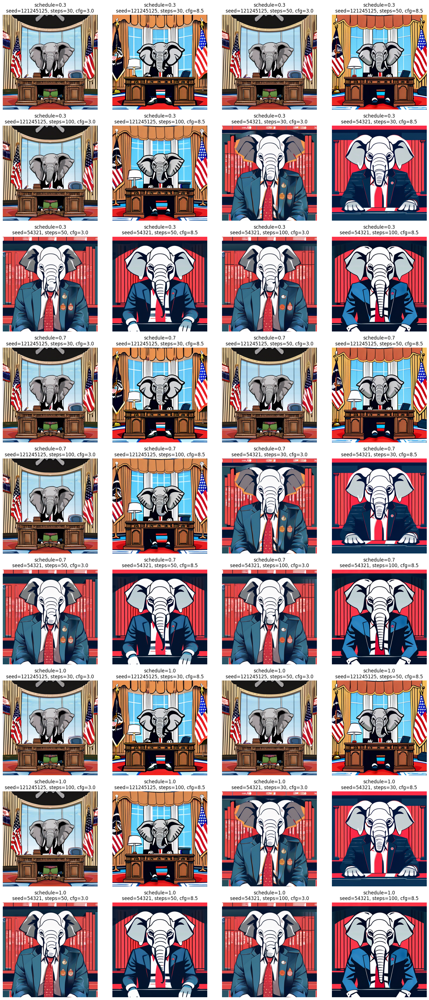

In [14]:
import itertools
import matplotlib.pyplot as plt

start_schedule_vals = [0.3, 0.7, 1.0]
seeds = [121245125, 54321]
steps_vals = [30, 50, 100]
cfg_scale_vals = [3.0, 8.5]

param_combinations = list(itertools.product(start_schedule_vals, seeds, steps_vals, cfg_scale_vals))
prompt = """
Generate me an image of an elephant dressed in urban streetwear sitting in the US Oval Office at the President's desk with the following qualities:

* Realistic Style
* HeadOn Shot
* Fun and Poppy urban style
""".strip()


images = generate_images(prompt, param_combinations)
plot_images(images)

### Transform Images

### Explanation of Parameters

1. start_schedule
What it is: Controls at what point in the diffusion schedule image generation begins, ranging from 0.0 (more noise, greater creativity) to 1.0 (less noise, closer adherence to prompt).
How it affects images:
Lower values (e.g., 0.2 - 0.5): More abstract, creative, unpredictable results.
Higher values (e.g., 0.8 - 1.0): Results closely match the prompt, with greater detail and realism.

2. seed - It provides randomness in the generation process and thus appears to produce slightly different images even if the other settings are the same.

3. steps -  Increased detail, but takes longer to create.

4. cfg_scale - Appears to determine how closely the prompt is followed. Higher values try harder to follow the prompt.

## Task 4: Hat removal (20 pts)
Utilize the Stability API to eliminate the hat present on the individual in the provided image. Configure the necessary transformation parameters and display the modified image.

#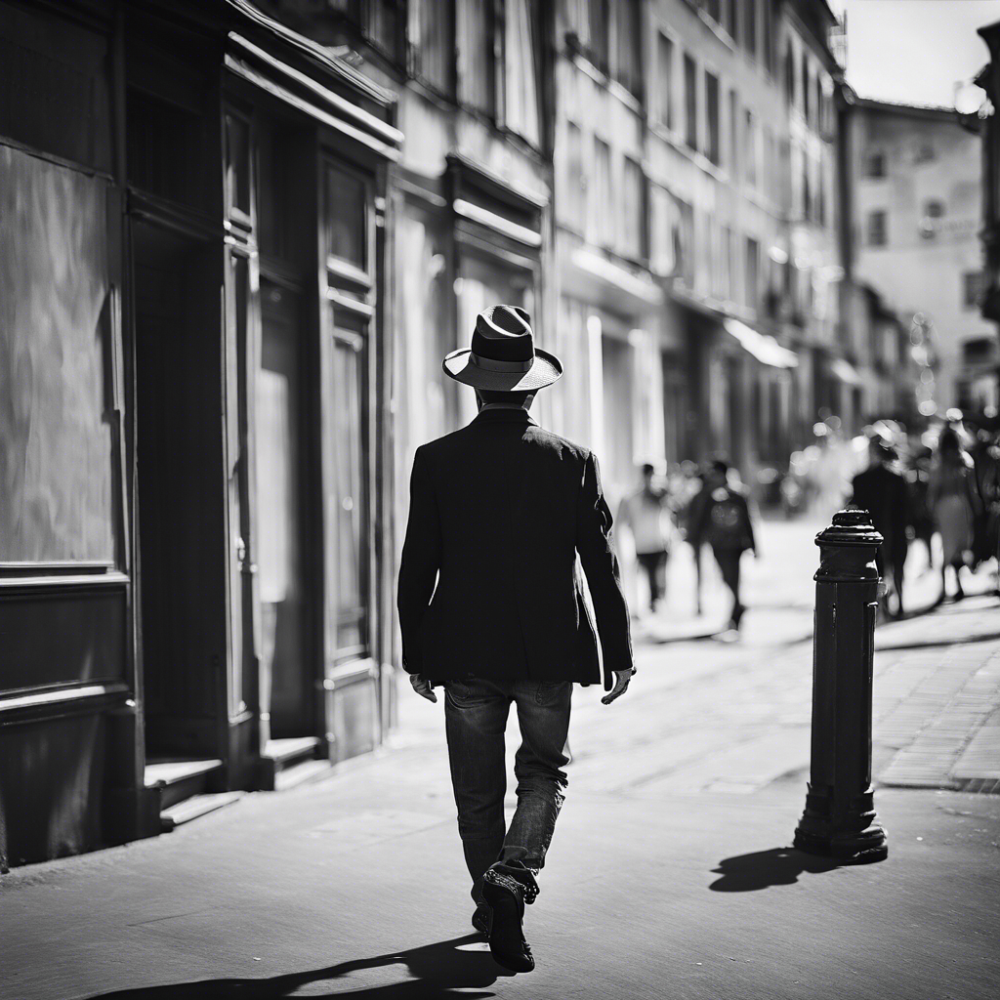

## Task 5: Background change (20 pts)
In this task, your objective is to alter the background of a given image while keeping the foreground elements or similar intact. You will utilize the Stability AI API to accomplish this.

##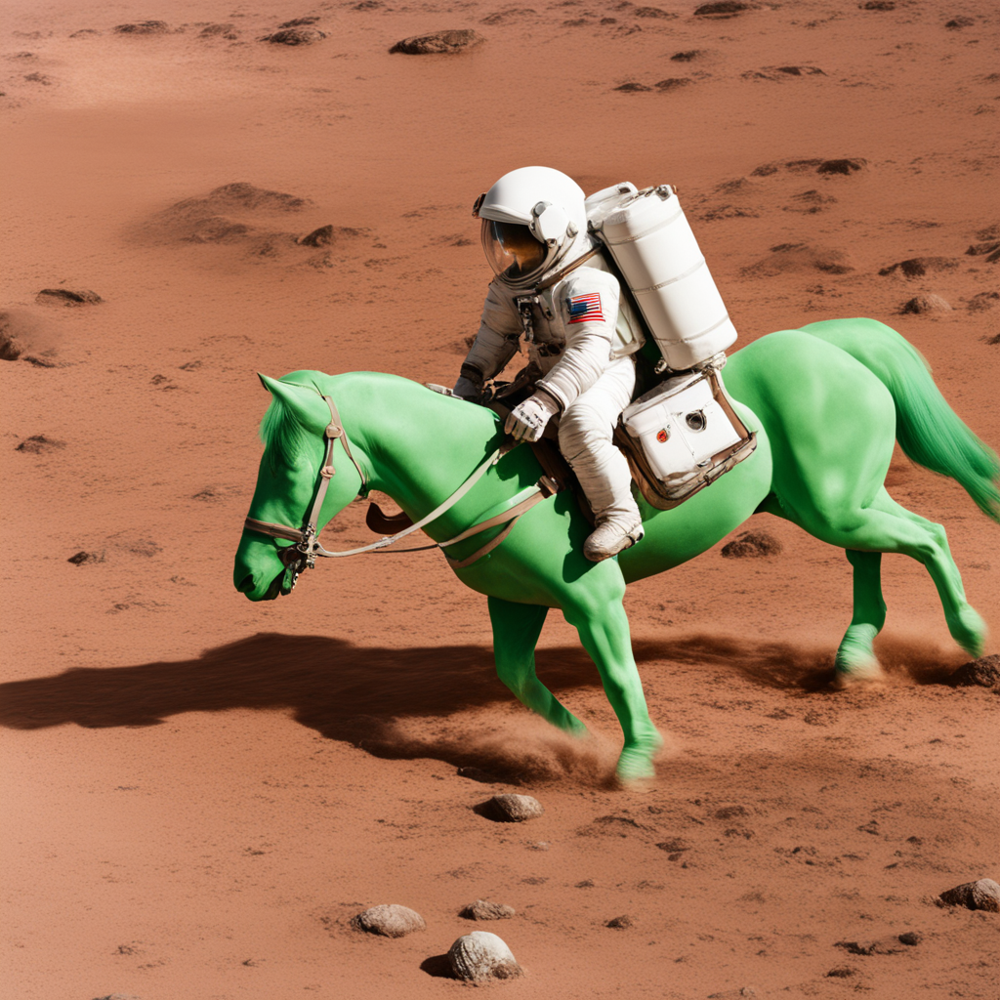

## Task 6: Hand drawn image to digital art (20 pts)

Upload a hand-drawn image and transform it into digital art using the Stability API. You could choose a sketch, a cartoon, or any other hand-drawn image. Set up the transformation parameters and display the transformed image.


## Task 7: Remove photobomber (Bonus 20 pts)
Remove the photobomber cat from the image using the Stability API. You will need to set up the prompt and display the transformed image.

Given below is the way to create a mask using segmentation model. You can use this mask to remove the cat from the image.

###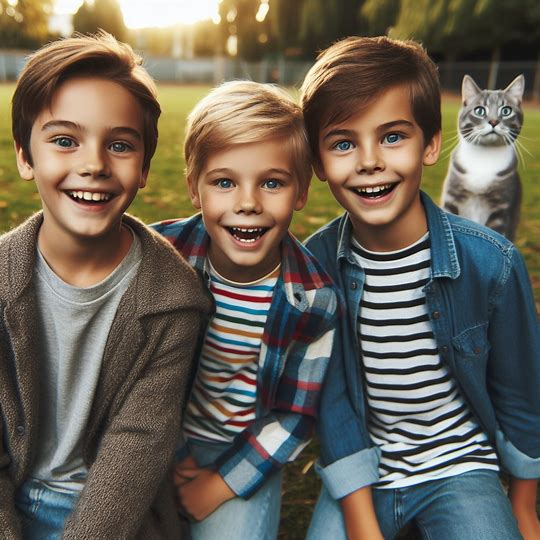

In [9]:
from transformers import MaskFormerFeatureExtractor, MaskFormerForInstanceSegmentation
from PIL import Image
import requests
import numpy as np
import cv2
import matplotlib.pyplot as plt

# Load MaskFormer model
feature_extractor = MaskFormerFeatureExtractor.from_pretrained("facebook/maskformer-swin-base-coco")
model = MaskFormerForInstanceSegmentation.from_pretrained("facebook/maskformer-swin-base-coco")

# Load image
image = Image.open('photobomb.jpeg')

# Preprocess image for MaskFormer
inputs = feature_extractor(images=image, return_tensors="pt")

# Get segmentation prediction
outputs = model(**inputs)
result = feature_extractor.post_process_panoptic_segmentation(outputs, target_sizes=[image.size[::-1]])[0]
predicted_panoptic_map = result["segmentation"]


image_np = np.array(image)
# Extract cat segmentation mask
cat_mask = np.zeros_like(predicted_panoptic_map)  # Initialize mask
cat_class_id = 4
cat_mask[predicted_panoptic_map == cat_class_id] = 1
# Convert segmentation mask to OpenCV format for processing
cat_mask_opencv = cv2.resize(cat_mask.astype(np.uint8), (image_np.shape[1], image_np.shape[0]), interpolation=cv2.INTER_NEAREST)

# Create photobomber mask (adjust threshold as desired)
threshold = 0.9
thresholded_mask = np.where(cat_mask_opencv > threshold, 0, 1).astype(np.uint8)  # Invert the mask

# Convert the mask to a 3-channel image
thresholded_mask_3ch = cv2.cvtColor(thresholded_mask, cv2.COLOR_GRAY2BGR)

# Display the mask
plt.imshow(thresholded_mask_3ch * 255, cmap='gray')
# saving the mask
cv2.imwrite('mask.png', thresholded_mask_3ch * 255)


/usr/local/lib/python3.11/dist-packages/huggingface_hub/utils/_auth.py:94: UserWarning: 
The secret `HF_TOKEN` does not exist in your Colab secrets.
To authenticate with the Hugging Face Hub, create a token in your settings tab (https://huggingface.co/settings/tokens), set it as secret in your Google Colab and restart your session.
You will be able to reuse this secret in all of your notebooks.
Please note that authentication is recommended but still optional to access public models or datasets.
  warnings.warn(


preprocessor_config.json:   0%|          | 0.00/380 [00:00<?, ?B/s]

/usr/local/lib/python3.11/dist-packages/transformers/models/maskformer/feature_extraction_maskformer.py:28: FutureWarning: The class MaskFormerFeatureExtractor is deprecated and will be removed in version 5 of Transformers. Please use MaskFormerImageProcessor instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/transformers/utils/deprecation.py:165: FutureWarning: `max_size` is deprecated and removed starting from version 4.27.0 for `MaskFormerFeatureExtractor.__init__`.
  return func(*args, **kwargs)
/usr/local/lib/python3.11/dist-packages/transformers/utils/deprecation.py:165: UserWarning: The following named arguments are not valid for `MaskFormerFeatureExtractor.__init__` and were ignored: 'feature_extractor_type'
  return func(*args, **kwargs)


config.json:   0%|          | 0.00/10.8k [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/411M [00:00<?, ?B/s]

FileNotFoundError: [Errno 2] No such file or directory: 'photobomb.jpeg'

### Feathering the edges of our mask generally helps provide a better result. Alternately, you can feather the mask in a suite like Photoshop or GIMP.


In [ ]:
from torchvision.transforms import GaussianBlur
mask_i = Image.open('mask.png')


blur = GaussianBlur(11,20)
mask = blur(mask_i)
mask

### TODO: Experiment with different prompts and parameters to remove the cat from the background of the image while keeping the rest of the image same


In [ ]:
answers = stability_api.generate(
    prompt="TODO",
    init_image=img,
    mask_image=mask,
    start_schedule=1,
    seed=44332211, # If attempting to transform an image that was previously generated with our API,
                   # initial images benefit from having their own distinct seed rather than using the seed of the original image generation.
    steps=50, # Amount of inference steps performed on image generation. Defaults to 30.
    cfg_scale=8.0, # Influences how strongly your generation is guided to match your prompt.
                   # Setting this value higher increases the strength in which it tries to match your prompt.
                   # Defaults to 7.0 if not specified.
    width=1024, # Generation width, if not included defaults to 512 or 1024 depending on the engine.
    height=1024, # Generation height, if not included defaults to 512 or 1024 depending on the engine.
    sampler=generation.SAMPLER_K_DPMPP_2M # Choose which sampler we want to denoise our generation with.
                                                 # Defaults to k_lms if not specified. Clip Guidance only supports ancestral samplers.
                                                 # (Available Samplers: ddim, plms, k_euler, k_euler_ancestral, k_heun, k_dpm_2, k_dpm_2_ancestral, k_dpmpp_2s_ancestral, k_lms, k_dpmpp_2m, k_dpmpp_sde)
)

# Set up our warning to print to the console if the adult content classifier is tripped. If adult content classifier is not tripped, display generated image.
for resp in answers:
    for artifact in resp.artifacts:
        if artifact.finish_reason == generation.FILTER:
            warnings.warn(
                "Your request activated the API's safety filters and could not be processed."
                "Please modify the prompt and try again.")
        if artifact.type == generation.ARTIFACT_IMAGE:
            img2 = Image.open(io.BytesIO(artifact.binary))
            display(img2)